In [1]:
from langdetect import detect
import time
import pandas as pd
import spacy
import gensim
import os
import numpy as np
import plotly.graph_objs as go
import nltk
nltk.download('omw')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from collections import Counter
from tqdm import tqdm
from datetime import datetime
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from kneed import KneeLocator

[nltk_data] Downloading package omw to C:\Users\Giovanni
[nltk_data]     Sacheli\AppData\Roaming\nltk_data...
[nltk_data]   Package omw is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\Giovanni
[nltk_data]     Sacheli\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Giovanni Sacheli\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to C:\Users\Giovanni
[nltk_data]     Sacheli\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Giovanni
[nltk_data]     Sacheli\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# scelta lingua

valid_languages = ['it', 'en', 'es', 'de', 'fr']
linguaz = ""

while linguaz not in valid_languages:
    linguaz = input("Lingua delle kw: it, en, es, de, fr? ")
    if linguaz not in valid_languages:
        print("Lingua non valida. Inserire 'it', 'en', 'es', 'de' o 'fr'.")

if linguaz == "en":
    stemmer = PorterStemmer()
    stopwords = stopwords.words('english')
    nlp = spacy.load("en_core_web_lg")
elif linguaz == "it":
    stemmer = SnowballStemmer("italian")
    stopwords = stopwords.words('italian')
    nlp = spacy.load("it_core_news_lg")
elif linguaz == "es":
    stemmer = SnowballStemmer("spanish")
    stopwords = stopwords.words('spanish')
    nlp = spacy.load("es_core_news_lg")
elif linguaz == "de":
    stemmer = SnowballStemmer("german")
    stopwords = stopwords.words('german')
    nlp = spacy.load("de_core_news_lg")
elif linguaz == "fr":
    stemmer = SnowballStemmer("french")
    stopwords = stopwords.words('french')
    nlp = spacy.load("fr_core_news_lg")

print(f"Lingua scelta: {linguaz}")
print(f"Stemmer: {stemmer}")
print(f"Stopwords: {stopwords}")
print(f"NLP: {nlp}")


Lingua scelta: it
Stemmer: <nltk.stem.snowball.SnowballStemmer object at 0x0000021CE05C5A80>
Stopwords: ['ad', 'al', 'allo', 'ai', 'agli', 'all', 'agl', 'alla', 'alle', 'con', 'col', 'coi', 'da', 'dal', 'dallo', 'dai', 'dagli', 'dall', 'dagl', 'dalla', 'dalle', 'di', 'del', 'dello', 'dei', 'degli', 'dell', 'degl', 'della', 'delle', 'in', 'nel', 'nello', 'nei', 'negli', 'nell', 'negl', 'nella', 'nelle', 'su', 'sul', 'sullo', 'sui', 'sugli', 'sull', 'sugl', 'sulla', 'sulle', 'per', 'tra', 'contro', 'io', 'tu', 'lui', 'lei', 'noi', 'voi', 'loro', 'mio', 'mia', 'miei', 'mie', 'tuo', 'tua', 'tuoi', 'tue', 'suo', 'sua', 'suoi', 'sue', 'nostro', 'nostra', 'nostri', 'nostre', 'vostro', 'vostra', 'vostri', 'vostre', 'mi', 'ti', 'ci', 'vi', 'lo', 'la', 'li', 'le', 'gli', 'ne', 'il', 'un', 'uno', 'una', 'ma', 'ed', 'se', 'perché', 'anche', 'come', 'dov', 'dove', 'che', 'chi', 'cui', 'non', 'più', 'quale', 'quanto', 'quanti', 'quanta', 'quante', 'quello', 'quelli', 'quella', 'quelle', 'questo', 'q

In [3]:
# Percorso della cartella
folder_path = "./input"

# Lista dei file Excel nella cartella
excel_files = [f for f in os.listdir(folder_path) if f.endswith(".xlsx") or f.endswith(".xls")]

# Controlla se ci sono file Excel nella cartella
if excel_files:
    print("Ecco l'elenco dei file Excel presenti nella cartella:")
    for index, file in enumerate(excel_files, start=1):
        print(f"{index}. {file}")

    while True:
        try:
            file_number = int(input("Inserisci il numero corrispondente al file da caricare: "))
            if 1 <= file_number <= len(excel_files):
                filename = os.path.join(folder_path, excel_files[file_number - 1])
                xl = pd.ExcelFile(filename)
                break
            else:
                print("Il numero inserito non corrisponde a nessun file. Riprova.")
        except ValueError:
            print("Si prega di inserire un numero valido.")
else:
    print("Nessun file Excel trovato nella cartella specificata.")
# ottieni la lista dei nomi dei fogli del file Excel
nomi_fogli = xl.sheet_names

Ecco l'elenco dei file Excel presenti nella cartella:
1. unopiu_final_output.xlsx
2. GSC_EXT_altalex.com_2023_03_20_11_50.xlsx
3. GSC_EXT_vhosting-it.com_2023_03_22_15_35.xlsx
4. dev.xlsx
5. live.xlsx
6. live - Copy.xlsx
7. dev - Copy.xlsx
8. GSC_EXT_eshop.wuerth.it_kw_list.xlsx
9. ibsa.xlsx
10. 1_de.xlsx
11. 1_fr.xlsx
12. GSC_EXT_eshop.wuerth.it_2023_05_16_10_09.xlsx


In [4]:
# stampa i nomi dei fogli
print("I fogli disponibili sono:")
for i, nome in enumerate(nomi_fogli):
    print(f"{i + 1}. {nome}")
   

I fogli disponibili sono:
1. Raw data
2. URL Raw data
3. Pivot Folders
4. Brand and not brand
5. Brand
6. CTR by position
7. Queries by position
8. Final output
9. Improve
10. Check tag title


In [5]:
# chiedi all'utente di selezionare un foglio da leggere
while True:
    try:
        indice_foglio = int(input("Inserisci il numero del foglio che desideri leggere: ")) - 1
        if 0 <= indice_foglio < len(nomi_fogli):
            nome_foglio = nomi_fogli[indice_foglio]
            break
        else:
            print("Il numero inserito non è valido. Riprova.")
    except ValueError:
        print("Inserisci un numero valido. Riprova.")
    except Exception as e:
        print(f"Si è verificato un errore: {e}. Riprova.")

# leggi il foglio selezionato dall'utente
df = pd.read_excel(filename, sheet_name=nome_foglio)
df.head(5)
print('foglio letto')


foglio letto


In [6]:
df.head(5)

,Unnamed: 0,query,page,clicks,impressions,ctr,position,Brand/Non-branded
0,0,wurth,https://eshop.wuerth.it/it/IT/EUR/,136428,203416,0.656170,1.041806,Brand
1,1,wurth,https://eshop.wuerth.it/Categorie-di-prodotti/...,6273,202557,0.033333,1.040430,Brand
2,2,wurth,https://eshop.wuerth.it/CATALOGHI/CATALOGHI.cy...,7280,201797,0.036571,1.039527,Brand
3,3,wurth,https://eshop.wuerth.it/Ferramenta-Online/Wuer...,1987,199377,0.010362,1.035005,Brand
4,4,wurth,https://eshop.wuerth.it/Categorie-di-prodotti/...,921,135915,0.008164,1.058265,Brand


In [7]:
# Crea una copia del dataframe originale
df1 = df.copy()

# Mostra all'utente le colonne disponibili nel dataframe
print("Here are the columns available in the dataframe:")
for i, col in enumerate(df1.columns):
    print(f"{i}: {col}")

Here are the columns available in the dataframe:
0: Unnamed: 0
1: query
2: page
3: clicks
4: impressions
5: ctr
6: position
7: Brand/Non-branded


In [8]:
# Chiedi all'utente di selezionare la colonna da mantenere
colonna_index = input("Enter the number of the column that contains the list of keywords: ")

# Continua a chiedere all'utente di inserire una colonna finché non viene fornita un'input valida
while not colonna_index.isdigit() or int(colonna_index) >= len(df1.columns):
    colonna_index = input("Invalid input. Please enter a valid column number: ")

colonna_da_mantenere = df1.columns[int(colonna_index)]


In [9]:
# Cancella tutte le colonne tranne quella selezionata dall'utente
df1 = df1[[colonna_da_mantenere]]

# Rinomina la colonna
df1.rename(columns={colonna_da_mantenere: "Keywords"}, inplace=True)
print('foglio rinominato')

# Rimuovi le righe con valori nulli o vuoti
df1 = df1[df1['Keywords'].notnull() & (df1['Keywords'].str.strip() != '')]
print('righe vuote, Null e NaN rimosse')

# Togli duplicazioni
df1.drop_duplicates(subset='Keywords', keep='first', inplace=True)
print('duplicazioni rimosse')

# Stampa il dataframe risultante
df1.head(5)


foglio rinominato
righe vuote, Null e NaN rimosse
duplicazioni rimosse


,Keywords
0,wurth
6,chiave dinamometrica
8,wuerth
11,avvitatore
12,ferramenta


In [10]:
# conta caratteri
df1c=df1.copy()
df1c['Keywords'] = df1c['Keywords'].fillna('')
df1c['Keywords'] = df1c['Keywords'].apply(str)
df1c['Char'] = df1c['Keywords'].apply(len)
df1c
print('colonna conta caratteri creata')
df2=df1c.copy()


colonna conta caratteri creata


In [11]:
# assegna alla colonna 'Without stopwords' del dataframe df2 il contenuto della prima colonna del dataframe df, convertendola in stringa
df2['Without stopwords'] = df2.iloc[:, 0].astype(str)

# rimuovi le stopwords dalla nuova colonna
df2['Without stopwords'] = df2['Without stopwords'].apply(
    lambda x: ' '.join([word for word in x.split() if word.lower() not in stopwords]))

df2
print('colonna senza stopword creata')

colonna senza stopword creata


In [12]:
# rimuovi termini indicati
# Chiedi all'utente di inserire le parole chiave da escludere, separate da virgola
exclude_words = input("If you want, enter keywords to be excluded from the classification, separated by comma: ").lower().split(",")
exclude_words = [word.strip() for word in exclude_words]
# Crea una copia della colonna "KW without stopwords"
df2['Without removed'] = df2['Without stopwords']
# Rimuovi le parole chiave escluse dalla nuova colonna
df2['Without removed'] = df2['Without removed'].apply(
    lambda x: ' '.join([word for word in x.split() if word.lower() not in exclude_words]))
# Visualizza il DataFrame con la nuova colonna
df2
print('colonna senza rimosse creata')

colonna senza rimosse creata


In [13]:
# stemming
df3=df2.copy()
# crea una copia della colonna "KW without stopwords"
df3['Stemming'] = df3['Without removed']
# esegui la stemming su ogni parola nella nuova colonna
df3['Stemming'] = df3['Stemming'].apply(
    lambda x: ' '.join([stemmer.stem(word) for word in x.split() if word.lower() not in stopwords]))
df3.head(5)

,Keywords,Char,Without stopwords,Without removed,Stemming
0,wurth,5,wurth,,
6,chiave dinamometrica,20,chiave dinamometrica,chiave dinamometrica,chiav dinamometr
8,wuerth,6,wuerth,,
11,avvitatore,10,avvitatore,avvitatore,avvit
12,ferramenta,10,ferramenta,ferramenta,ferrament


In [14]:
df4=df3.copy()
# crea una lista con tutti gli stemmi presenti nella colonna "Long Tail senza stopwords stemmata"
stem_list = []
for row in df4['Stemming']:
    stem_list.extend(row.split())
# conta le occorrenze di ogni stemma nella lista
stem_counts = Counter(stem_list)
# crea una lista di tuple (stemma, frequenza) ordinata in base alla frequenza decrescente
sorted_stems = sorted(stem_counts.items(), key=lambda x: x[1], reverse=True)
# crea un dizionario per mappare gli stemmi alle loro posizioni nella lista ordinata
stem_position_dict = {}
for i, (stem, _) in enumerate(sorted_stems):
    stem_position_dict[stem] = i
# crea la nuova colonna ordinando gli stemmi per frequenza assoluta
df4['Ordered by frequency'] = df4['Stemming'].apply(
    lambda x: ' '.join(sorted(x.split(), key=lambda s: stem_position_dict[s])))
df4.head(25)
print('colonna stemmi ordinati creata')

colonna stemmi ordinati creata


In [15]:
df5=df4.copy()
# stemma più frequente try ok eng ok it
# creo una nuova colonna chiamata "Stemma più frequente"
df5['Strongest word stem'] = df5['Ordered by frequency'].str.split().str[0]

df5.head(5)

,Keywords,Char,Without stopwords,Without removed,Stemming,Ordered by frequency,Strongest word stem
0,wurth,5,wurth,,,,NaN
6,chiave dinamometrica,20,chiave dinamometrica,chiave dinamometrica,chiav dinamometr,chiav dinamometr,chiav
8,wuerth,6,wuerth,,,,NaN
11,avvitatore,10,avvitatore,avvitatore,avvit,avvit,avvit
12,ferramenta,10,ferramenta,ferramenta,ferrament,ferrament,ferrament


In [16]:
# Calcola la frequenza di ogni parola in Strongest word stem
word_freq = df5['Strongest word stem'].value_counts(normalize=True)

# Calcola il valore percentuale cumulativo di ogni parola in Strongest word stem
word_cum_pct = word_freq.cumsum()

# Classifica la forza della parola in Strongest word stem in base al valore percentuale cumulativo
print('classificazione hi med low in corso')
def classify_word_strength(word):
    try:
        if word_cum_pct[word] <= 0.6:  # frequenza alta: "hi"
            return "hi"
        elif word_cum_pct[word] <= 0.8:  # frequenza media: "med"
            return "med"
        else:  # frequenza bassa: "low"
            return "low"
    except KeyError:
        return "unknown"

df5['Word Strength'] = df5['Strongest word stem'].apply(classify_word_strength)
df5.head(5)
print('classificazione hi med low termianta')

classificazione hi med low in corso
classificazione hi med low termianta


In [17]:
# stemmi
df6=df5.copy()

# Crea la nuova colonna "2 Stemmi più frequente" con i due stemmi più frequenti
df6['Strongest 2 words stems'] = df6['Ordered by frequency'].str.split().str[:2].str.join(' ')
df6.loc[df6['Strongest 2 words stems'].str.count(' ') < 1, 'Strongest 2 words stems'] = ''
# Stampa il DataFrame con la nuova colonna
df6.head(25)
print('classificazione 2x stemmi')
#triplo stemma try ok

df7=df6.copy()
df7['Strongest 3 words stems'] = df7['Ordered by frequency'].str.split().str[:3].str.join(' ')
df7.loc[df7['Strongest 3 words stems'].str.count(' ') < 2, 'Strongest 3 words stems'] = ''

df7.head(5)
print('classificazione 3x stemmi')
#quadruplo stemma try ok

df8 = df7.copy()
#df8['Strongest 4 words stems'] = df7['Ordered by frequency'].str.split().str[:4].str.join(' ')

df8['Strongest 4 words stems'] = df7['Ordered by frequency'].str.split().str[:4].str.join(' ')
df8.loc[df8['Strongest 4 words stems'].str.count(' ') < 3, 'Strongest 4 words stems'] = ''

print('classificazione 4x stemmi')
df8.head(5)



classificazione 2x stemmi
classificazione 3x stemmi
classificazione 4x stemmi


,Keywords,Char,Without stopwords,Without removed,Stemming,Ordered by frequency,Strongest word stem,Word Strength,Strongest 2 words stems,Strongest 3 words stems,Strongest 4 words stems
0,wurth,5,wurth,,,,NaN,unknown,,,
6,chiave dinamometrica,20,chiave dinamometrica,chiave dinamometrica,chiav dinamometr,chiav dinamometr,chiav,hi,chiav dinamometr,,
8,wuerth,6,wuerth,,,,NaN,unknown,,,
11,avvitatore,10,avvitatore,avvitatore,avvit,avvit,avvit,hi,,,
12,ferramenta,10,ferramenta,ferramenta,ferrament,ferrament,ferrament,med,,,


In [18]:
# kmeans try autocluster TF-IDF
######################################################################
# imposta il numero massimo di cluster da testare
max_clusters = 30 
######################################################################

# leggi il file csv con il dataframe
df10 = df8.copy()
print('classificazione kmeans TF-IDF iniziata')
# crea un vettore Tfidf per le parole chiave nella colonna "Ordered by frequency"
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df10['Ordered by frequency'])

# applica il metodo del gomito per trovare il numero ottimale di cluster
inertias = []

for k in range(1, max_clusters+1):     
    start_time = time.time()  # memorizza il tempo di inizio del ciclo
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)
    elapsed_time1 = time.time() - start_time  # calcola il tempo impiegato per eseguire il ciclo
    print(f'Il ciclo {k} / 30 ha impiegato {elapsed_time1:.2f} secondi.')

# utilizza il metodo del gomito per trovare il numero ottimale di cluster
kn = KneeLocator(range(1, max_clusters+1), inertias, curve='convex', direction='decreasing')
num_clusters = kn.knee # impostiamo il numero di cluster desiderato

# esegui il clustering KMeans su X con il numero di cluster scelto
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(X)


classificazione kmeans TF-IDF iniziata


e:\python\ambiente\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Il ciclo 1 / 30 ha impiegato 5.22 secondi.
Il ciclo 2 / 30 ha impiegato 5.22 secondi.
Il ciclo 3 / 30 ha impiegato 5.57 secondi.
Il ciclo 4 / 30 ha impiegato 6.07 secondi.
Il ciclo 5 / 30 ha impiegato 6.27 secondi.
Il ciclo 6 / 30 ha impiegato 6.66 secondi.
Il ciclo 7 / 30 ha impiegato 6.85 secondi.
Il ciclo 8 / 30 ha impiegato 7.64 secondi.
Il ciclo 9 / 30 ha impiegato 8.00 secondi.
Il ciclo 10 / 30 ha impiegato 9.37 secondi.
Il ciclo 11 / 30 ha impiegato 8.70 secondi.
Il ciclo 12 / 30 ha impiegato 8.74 secondi.
Il ciclo 13 / 30 ha impiegato 9.57 secondi.
Il ciclo 14 / 30 ha impiegato 10.58 secondi.
Il ciclo 15 / 30 ha impiegato 9.41 secondi.
Il ciclo 16 / 30 ha impiegato 10.16 secondi.
Il ciclo 17 / 30 ha impiegato 11.76 secondi.
Il ciclo 18 / 30 ha impiegato 12.13 secondi.
Il ciclo 19 / 30 ha impiegato 11.40 secondi.
Il ciclo 20 / 30 ha impiegato 13.00 secondi.
Il ciclo 21 / 30 ha impiegato 12.51 secondi.
Il ciclo 22 / 30 ha impiegato 13.43 secondi.
Il ciclo 23 / 30 ha impiegato 13.

KMeans(n_clusters=9, random_state=42)

In [19]:
# assegnazione nome ai cluster
# identifica le parole chiave più rappresentative di ogni cluster
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
#terms = vectorizer.get_feature_names()
terms = vectorizer.vocabulary_.keys()

cluster_names = []
for i in range(num_clusters):
    #top_keywords = [terms[ind] for ind in order_centroids[i, :5]]
    top_keywords = [list(terms)[ind] for ind in order_centroids[i, :5]]
    cluster_names.append(f"{i+1}, {' '.join(top_keywords)}")

# crea una nuova colonna "KMeans" che contiene il nome del cluster per ogni parola chiave
df10['KMeans'] = kmeans.labels_

# sostituisce l'etichetta numerica del cluster con il nome del cluster
df10['KMeans'] = df10['KMeans'].map(lambda x: cluster_names[x])

# conta cluster
print(f"Numero di cluster scelto: {num_clusters}")

# stampa il numero di parole chiave per ogni cluster
print(df10['KMeans'].value_counts())

df10.head(10)
print('classificazione kmeans terminata')

Numero di cluster scelto: 9
1, sperrkantscheib smontamoll meteorolog tavell rwedition     105516
9, clipcon zigom 290 sperrkantscheib wellendichtring            2943
4, hygieneprodukt tensioner schweissmutter mq abdeckpapier      2897
6, prefilett poliermaschin lettur assy4 plates                  2840
2, xf installationsmaterial kd poliermaschin sostitu            2796
5, leic riscolpitur nicc alyri piat                             2565
3, romp wurtheshop pressfit neu trommelw                        2180
8, duster puntr abdekung 0890117 muetter                        2153
7, nazion kegelstrumpf türschlösser sperrkantscheib almax       1960
Name: KMeans, dtype: int64
classificazione kmeans terminata


In [20]:
# GFX
df11=df10.copy()
df11['KMeans_cat'] = pd.Categorical(df11['KMeans']).codes

# crea un grafico a dispersione 3D con i cluster
trace = go.Scatter3d(
    x=df11['KMeans_cat'],  # assegna alle coordinate x il valore numerico dell'etichetta del cluster
    y=df11.index,  # assegna alle coordinate y l'indice del dataframe
    z=df11['Ordered by frequency'],  # assegna alle coordinate z la frequenza nella colonna "Ordered by frequency"
    mode='markers',
    marker=dict(
        size=10,
        color=df11['KMeans_cat'],  # colora i punti in base all'etichetta del cluster
        colorscale='Viridis',
        opacity=0.8
    )
)

# aggiungi i dati al layout
data = [trace]
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='Cluster'),
        yaxis=dict(title='Index'),
        zaxis=dict(title='Ordered by frequency')
    )
)

# crea il grafico
fig = go.Figure(data=data, layout=layout)
#fig.show()
#fig.show(renderer="browser")
fig.show(renderer="notebook")
#fig.show(renderer="png")

In [21]:
# GFX
# copia il DataFrame originale
df11 = df10.copy()

# crea una colonna KMeans_cat con le etichette dei cluster convertite in numeri
df11['KMeans_cat'] = pd.Categorical(df11['KMeans']).codes

# crea un grafico a dispersione 2D con i cluster rappresentati dai colori dei punti
trace = go.Scatter(
    x=df11['KMeans_cat'],  # assegna alle coordinate x il valore numerico dell'etichetta del cluster
    y=df11['Ordered by frequency'],  # assegna alle coordinate y la frequenza nella colonna "Ordered by frequency"
    mode='markers',
    marker=dict(
        size=10,
        color=df11['KMeans_cat'],  # colora i punti in base all'etichetta del cluster
        colorscale='Viridis',
        opacity=0.8
    )
)

# aggiungi i dati al layout
data = [trace]
layout = go.Layout(
    title='Grafico a dispersione 2D',
    xaxis=dict(title='Cluster'),
    yaxis=dict(title='Ordered by frequency')
)

# crea il grafico
fig = go.Figure(data=data, layout=layout)
#fig.show(renderer="browser")
fig.show(renderer="notebook")
#fig.show(renderer="png")

In [22]:
# SPACY VERBI NOMI AGGETTIVI
df2vec = df10.copy()

print('classificazione Spacy per VERBI NOMI AGGETTIVI avviata')
# Crea le liste per conservare le categorie delle parole chiave, VERB e NOUN e ADJ e NOUN
spacy_cat = []
spacy_lemma = []
verb_noun_cat = []
adj_noun_cat = []

# Analizza ogni riga del DataFrame con Spacy
for row in tqdm(df2vec['Keywords']):
#for row in df2vec['Keywords']:
    doc = nlp(row)
    category = None
    lemma = None
    verb_noun = []
    adj_noun = []
  
    # Estrae le categorie e lemmi di NOUN dalla riga
    for token in doc:
        if token.pos_ in ['NOUN']:
            category = token.text
            lemma = token.lemma_
        if token.pos_ in ['VERB', 'NOUN']:
            verb_noun.append(token.text)
        if token.pos_ in ['ADJ', 'NOUN']:
            adj_noun.append(token.text)
    
    # Assegna una categoria predefinita se non è stata identificata nessuna categoria
    if category is None:
        category = 'other'
    if lemma is None:
        lemma = 'other'
    
    # Aggiungi le categorie e lemmi alla lista
    spacy_cat.append(category)
    spacy_lemma.append(lemma)
    
    # Aggiungi le categorie VERB e NOUN e ADJ e NOUN alle liste
    verb_noun_cat.append(', '.join(verb_noun))
    adj_noun_cat.append(', '.join(adj_noun))

# Aggiungi le liste delle categorie come nuove colonne del DataFrame
df2vec['spacy_cat'] = spacy_cat
df2vec['spacy_lemma'] = spacy_lemma
df2vec['verb_noun_cat'] = verb_noun_cat
df2vec['adj_noun_cat'] = adj_noun_cat

# Visualizza il dataframe con le categorie assegnate
df2vec.head(5)
print('classificazione Spacy terminata')


classificazione Spacy per VERBI NOMI AGGETTIVI avviata


100%|██████████| 125850/125850 [13:08<00:00, 159.66it/s]


classificazione Spacy terminata


In [23]:
# stampa numero di core della CPU, valore da usare in workers
import multiprocessing
num_cores = multiprocessing.cpu_count()
print(f'Il numero di core CPU disponibili è: {num_cores}')

Il numero di core CPU disponibili è: 16


In [24]:
# w2v auto cluster
print('classificazione w3v iniziata')
df_w2v = df2vec.copy() # Copia il dataframe w2v
keywords = df_w2v['Keywords'].apply(lambda x: x.split(',')).tolist() # Converte la colonna "Keywords" in una lista di liste di parole chiave
num_keywords = len(keywords) # conta parole
# Addestra il modello Word2Vec sulle parole chiave
#vector_size da 100 a 400, window 10, min_count 1, workers core cpu
model = gensim.models.Word2Vec(keywords, vector_size=300, window=10, min_count=1, workers=num_cores, batch_words=1000)
# Esegui il clustering dei vettori Word2Vec utilizzando KMeans
wcss = []
for i in range(1, 21):
    start_time = time.time()  # memorizza il tempo di inizio del ciclo
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(model.wv.vectors)
    wcss.append(kmeans.inertia_)
    elapsed_time = time.time() - start_time  # calcola il tempo impiegato per eseguire il ciclo
    print(f'Il ciclo {i} / 21 ha impiegato {elapsed_time:.2f} secondi.')
print('Test del clustering eseguito!')

classificazione w3v iniziata
Il ciclo 1 / 21 ha impiegato 1.81 secondi.
Il ciclo 2 / 21 ha impiegato 12.52 secondi.
Il ciclo 3 / 21 ha impiegato 18.40 secondi.
Il ciclo 4 / 21 ha impiegato 26.35 secondi.
Il ciclo 5 / 21 ha impiegato 33.99 secondi.
Il ciclo 6 / 21 ha impiegato 39.63 secondi.
Il ciclo 7 / 21 ha impiegato 53.79 secondi.
Il ciclo 8 / 21 ha impiegato 62.08 secondi.
Il ciclo 9 / 21 ha impiegato 65.42 secondi.
Il ciclo 10 / 21 ha impiegato 70.31 secondi.
Il ciclo 11 / 21 ha impiegato 72.60 secondi.
Il ciclo 12 / 21 ha impiegato 76.00 secondi.
Il ciclo 13 / 21 ha impiegato 80.21 secondi.
Il ciclo 14 / 21 ha impiegato 84.42 secondi.
Il ciclo 15 / 21 ha impiegato 73.57 secondi.
Il ciclo 16 / 21 ha impiegato 57.03 secondi.
Il ciclo 17 / 21 ha impiegato 59.88 secondi.
Il ciclo 18 / 21 ha impiegato 58.78 secondi.
Il ciclo 19 / 21 ha impiegato 64.08 secondi.
Il ciclo 20 / 21 ha impiegato 63.42 secondi.
Test del clustering eseguito!


note sul calcolo del gomito:

Dai tuoi script, sembra che stai utilizzando due diversi tipi di dati per i due algoritmi di clustering. Nel primo stai utilizzando il TF-IDF delle parole chiave, mentre nel secondo stai utilizzando i vettori Word2Vec delle parole chiave. Quindi, in questo caso, è necessario calcolare il numero ottimale di cluster per ciascuno di questi set di dati, quindi è necessario utilizzare il metodo del gomito due volte.

Il motivo è che il numero ottimale di cluster dipende dal set di dati che stai utilizzando. Anche se le parole chiave sono le stesse, la rappresentazione di queste parole (TF-IDF vs Word2Vec) potrebbe essere molto diversa, quindi il numero ottimale di cluster potrebbe non essere lo stesso per i due set di dati.

Riassumendo, non puoi evitare di eseguire il calcolo del gomito due volte in questo caso, dato che stai lavorando con due rappresentazioni diverse dei dati.

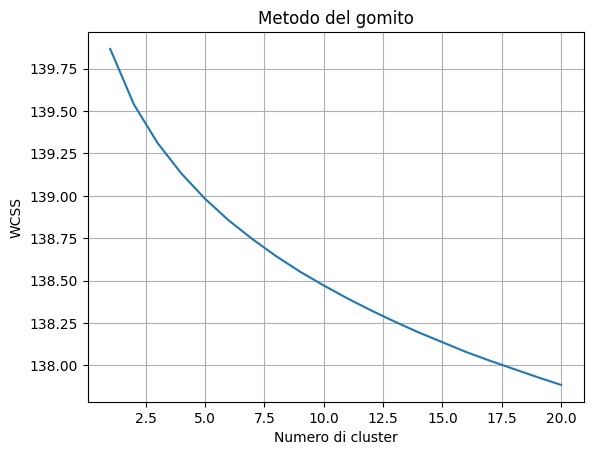

In [25]:
# Plot del grafico del metodo del gomito
plt.plot(range(1, 21), wcss)
plt.title('Metodo del gomito')
plt.xlabel('Numero di cluster')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [26]:
# calcola i cluster w2v
# Seleziona il numero di cluster in base al metodo del gomito
knee_locator = KneeLocator(range(1, 21), wcss, curve='convex', direction='decreasing')  # Crea un oggetto KneeLocator con i risultati del metodo del gomito
try:
    n_clusters = knee_locator.knee  # Cerca il gomito, ovvero il punto in cui l'inerzia smette di diminuire rapidamente
except ValueError:  # Se non viene trovato alcun gomito, utilizza 2 cluster
    n_clusters = 2

# Calcola la media dei vettori per ogni parola chiave
vectors = []

for i, words in enumerate(keywords):  # Cicla attraverso la lista delle parole chiave e i relativi vettori di parole
    word_vectors = []
    for word in words:
        if word in model.wv.key_to_index:  # Controlla se la parola è presente nel vocabolario del modello
        #if word in model.wv.vocab:  # Controlla se la parola è presente nel vocabolario del modello
            word_vectors.append(model.wv[word])  # Aggiunge il vettore della parola alla lista dei vettori
    if word_vectors:  # Se ci sono vettori presenti nella lista
        vectors.append(np.mean(np.array(word_vectors), axis=0))  # Calcola la media dei vettori delle parole presenti nella lista e la aggiunge alla lista dei vettori medi
    else:
        vectors.append(np.zeros(100))  # Se non ci sono parole presenti nella lista, aggiunge un vettore di zeri alla lista dei vettori medi

# Converti gli array in float64
vectors = np.array(vectors).astype('float32')

# Assegna una categoria a ogni parola chiave in base alle etichette del clustering
if n_clusters is not None and n_clusters > len(keywords):
    # se il numero di cluster è maggiore del numero di parole chiave, utilizza un numero di cluster uguale al numero di parole chiave
    n_clusters = len(keywords)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)  # Inizializza l'oggetto KMeans con il numero di cluster selezionato e uno stato casuale predefinito
kmeans.fit(model.wv.vectors)  # Esegue il clustering sui vettori del modello Word2Vec
w2v_categories = kmeans.predict(vectors)  # Assegna una categoria a ogni parola chiave sulla base dell'etichetta del clustering
df_w2v['w2v_cat'] = w2v_categories  # Aggiunge le categorie assegnate come una nuova colonna del dataframe

# Print conteggio cluster
print(f"Numero di cluster scelto: {n_clusters}") 

# Visualizza il DataFrame con le categorie assegnate
df_w2v.head(20)
print('classificazione w3v terminata')

e:\python\ambiente\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Numero di cluster scelto: 7
classificazione w3v terminata


In [27]:
# detect language
print('classificazione LANG iniziata')
dfL_w2v = df_w2v.copy()

langs = []
for x in tqdm(dfL_w2v['Keywords'], desc="Linguaggio", total=len(dfL_w2v)):
    if len(x) > 0 and any(c.isalpha() for c in x):
        try:
            lang = detect(x)
        except:
            lang = ''
    else:
        lang = ''
    langs.append(lang)

dfL_w2v['Lang'] = langs

dfL_w2v
print('classificazione LANG terminata')

classificazione LANG iniziata


Linguaggio: 100%|██████████| 125850/125850 [12:55<00:00, 162.35it/s]

classificazione LANG terminata


In [28]:
# leggi il dataframe dal file

# cicla su tutte le colonne del DataFrame tranne che sulla prima
for col in dfL_w2v.columns[1:]:
#for col in df_w2v.columns:
    # crea un nuovo DataFrame con una sola colonna per la colonna corrente
    colonna = dfL_w2v[col].dropna().reset_index(drop=True)
    
    # calcola le prime 5 stringhe più frequenti nella colonna
    freq = colonna.value_counts().head(5)
    
    # stampa il nome della colonna e le stringhe più frequenti
    print(f"Le prime 5 stringhe più frequenti in '{col}' sono:")
    print(freq)
    print()
# crea il percorso completo per il file txt
cartella_output = "./output"

nome_file = f"CLUSTER_TXT_{sorted_stems[0][0]}.txt"
percorso_completo = os.path.join(cartella_output, nome_file)

# Apri il file in modalità scrittura
with open(percorso_completo, "w") as f:
#with open(nome_file, "w") as f:
    # Cicla su tutte le colonne del DataFrame tranne che sulla prima
    for col in dfL_w2v.columns[1:]:
        # Crea un nuovo DataFrame con una sola colonna per la colonna corrente
        colonna = dfL_w2v[col].dropna().reset_index(drop=True)
        # Calcola le prime 5 stringhe più frequenti nella colonna
        freq = colonna.value_counts().head(5)
        # Scrivi il nome della colonna e le stringhe più frequenti nel file
        f.write(f"Le prime 5 stringhe più frequenti in '{col}' sono:\n")
        f.write(f"{freq}\n\n")

Le prime 5 stringhe più frequenti in 'Char' sono:
19    5408
17    5394
18    5372
20    5258
21    5249
Name: Char, dtype: int64

Le prime 5 stringhe più frequenti in 'Without stopwords' sono:
w                   18
pistola silicone    10
                    10
ferramenta           9
profili acciaio      9
Name: Without stopwords, dtype: int64

Le prime 5 stringhe più frequenti in 'Without removed' sono:
                    22
w                   18
shop                14
pistola silicone    14
viti                12
Name: Without removed, dtype: int64

Le prime 5 stringhe più frequenti in 'Stemming' sono:
vit              25
profil acciai    22
                 22
tassell          20
profil           19
Name: Stemming, dtype: int64

Le prime 5 stringhe più frequenti in 'Ordered by frequency' sono:
punt ferr trap    26
vit               25
silicon pistol    24
                  22
acciai profil     22
Name: Ordered by frequency, dtype: int64

Le prime 5 stringhe più frequenti in 'Stro

In [29]:
# export to excel
dataframes = {
    'dfL_w2v': 'Cluster'
}

print('exporting...')

#os.makedirs(cartella_output, exist_ok=True)
# ottieni la data e l'ora corrente
now = datetime.now()
# formatta il timestamp nel formato desiderato
timestamp = now.strftime("%Y%m%d_%H%M")
filename = f'{timestamp}_CLUSTER_{sorted_stems[0][0]}.xlsx'
with pd.ExcelWriter(os.path.join(cartella_output, filename)) as writer:
#with pd.ExcelWriter(os.path.join(output_dir, f'{sorted_stems[0][0]}.xlsx')) as writer:
    for df_name, sheet_name in tqdm(dataframes.items(), total=len(dataframes), desc="Saving Dataframes"):
        if df_name in locals():
            locals()[df_name].to_excel(writer, sheet_name=sheet_name, index=True)
print(f'\n{filename}.xlsx exported and ready for download in {cartella_output}')

exporting...


Saving Dataframes: 100%|██████████| 1/1 [00:22<00:00, 22.10s/it]



20230516_1103_CLUSTER_port.xlsx.xlsx exported and ready for download in ./output
